# [Part.1]
## 1. Run preprocess function
- original image and bounding box
- random resized image & bounding box
- random flipped image & bounding box
- random rotated image & bounding box
- random translated X image & bounding box
- random translated Y image & bounding box
- random sheared X image & bounding box
- random sheared Y image & bounding box

### 2. Check function -- Part.2
### 3. Test crop_bbox code -- Part.2
### 4. Test function that process bboxes before and after executing preprocess function -- Part.3
### 5. Test reduce_min & reduce_max -- Part.3


In [1]:
from pathlib import Path

import tensorflow as tf
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

class DatasetGenerator(object):
    def __init__(self, data_dir, input_size, output_size, batch_size):
        self.data_dir = Path(data_dir)
        self.input_size = input_size
        self.output_size = output_size
        self.batch_size = batch_size
        self._num_bbox = 0

    def run(self, train_num_bbox, val_num_bbox, preprocessed=None):
        return self.get_tfdataset(
            train=True, num_bbox=train_num_bbox,
            preprocessed=preprocessed), self.get_tfdataset(
                train=False, num_bbox=val_num_bbox)

    def get_tfdataset(self, train, num_bbox, preprocessed=None):
        self._num_bbox = num_bbox
        tfrecords_dir = self.data_dir / 'tfrecords' / f'{"train" if train else "val"}_{self.input_size}'
        tfrecords_files = [str(f) for f in tfrecords_dir.glob('*.tfrecords')]
        tfrecords = tf.data.TFRecordDataset(
            tfrecords_files, num_parallel_reads=len(tfrecords_files))
        ds = tfrecords
        if train:
            ds = ds.shuffle(buffer_size=10000, seed=42) 
        ds = ds.map(self._parse_tfrecord,
                    num_parallel_calls=tf.data.experimental.AUTOTUNE)
        if train and preprocessed:
            
            ds = ds.map(self._extract_valid_bboxes,
                         num_parallel_calls=tf.data.experimental.AUTOTUNE)
                
            ds = ds.map(self._convert_image_float32,
                         num_parallel_calls=tf.data.experimental.AUTOTUNE)
            
            for preprocess in preprocessed:
                ds = ds.map(preprocess,
                            num_parallel_calls=tf.data.experimental.AUTOTUNE)
                
            ds = ds.map(self._convert_image_uint8,
                        num_parallel_calls=tf.data.experimental.AUTOTUNE)
            
            ds = ds.map(self._pad_bboxes,
                         num_parallel_calls=tf.data.experimental.AUTOTUNE)
            

        ds = ds.map(lambda i, o: (preprocess_input(tf.cast(i, tf.float32)), o),
                      num_parallel_calls=tf.data.experimental.AUTOTUNE)
        ds = ds.batch(self.batch_size)
        ds = ds.prefetch(tf.data.experimental.AUTOTUNE)    

        return ds

    def _parse_tfrecord(self, tfrecord):
        tf_example = tf.io.parse_single_example(tfrecord,
                                                features={
                                                    'image_raw':
                                                    tf.io.FixedLenFeature(
                                                        (), tf.string),
                                                    'bboxes':
                                                    tf.io.FixedLenFeature(
                                                        (self._num_bbox, 4),
                                                        tf.float32)
                                                })
        image = tf.image.decode_jpeg(tf_example['image_raw'], channels=3)
        bboxes = tf_example['bboxes']
        
        return image, bboxes

    def _convert_image_float32(self, image, bboxes):
        return tf.image.convert_image_dtype(image, tf.float32), bboxes

    def _convert_image_uint8(self, image, bboxes):
        return tf.image.convert_image_dtype(image, tf.uint8), bboxes
    
    def _extract_valid_bboxes(self, image, bboxes):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]
        return tf.image.convert_image_dtype(image, tf.uint8), valid_bboxes
    
    def _pad_bboxes(self, image, bboxes):
        padded_bboxes = tf.pad(bboxes,[[0, self._num_bbox - tf.shape(bboxes)[0]], [0, 0]],'CONSTANT')
        return tf.image.convert_image_dtype(image, tf.uint8), padded_bboxes


In [2]:
%matplotlib inline

import matplotlib.image as mpimg
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import tensorflow as tf

def draw_bbox(image, bboxes):
    plt.imshow(image)
    for bbox in bboxes:
        x1, y1, x2, y2 = bbox
        patch = patches.Rectangle((float(x1), float(y1)), float(x2-x1), float(y2-y1), alpha=0.5)
        plt.gca().add_patch(patch)
    plt.show()
    plt.clf()

In [3]:
import tensorflow as tf
import tensorflow_addons as tfa
import math


def random_factor(minval=0, maxval=None):
    return tf.random.uniform([], minval, maxval, seed=42)


def last_coord_factor(image):
    input_size = tf.cast(tf.shape(image)[0], tf.float32)
    last_coord = input_size - 1
    return last_coord


def random_resize(image,
                  bboxes,
                  run_criteria=0.3,
                  scale_min=0.7,
                  scale_max=1.3):
    do_a_resize_random = random_factor() < run_criteria
    if do_a_resize_random:
        scale_factor = random_factor(scale_min, scale_max)
        adjusted_image = _resize_image(image, scale_factor)
        adjusted_bboxes = _resize_bbox(last_coord_factor(image), bboxes,
                                       scale_factor)
        return adjusted_image, adjusted_bboxes
    else:
        return image, bboxes


def _resize_image(image, scale_factor):
    input_size = tf.cast(tf.shape(image)[0], tf.float32)
    box_indices = 0.5 + 0.5 / tf.convert_to_tensor(
        [[-scale_factor, -scale_factor, scale_factor, scale_factor]])
    resized_image = tf.image.crop_and_resize(
        [image], box_indices, [0],
        [int(input_size), int(input_size)])[0]
    return resized_image


def _resize_bbox(last_coord, bboxes, scale_factor):
    center = last_coord / 2
    resized_bboxes = tf.reshape(bboxes, (-1, 2))
    resized_bboxes = (resized_bboxes - center) @ [[scale_factor, 0],
                                                [0, scale_factor]] + center
    resized_bboxes = tf.reshape(resized_bboxes, (-1, 4))
    if scale_factor > 1:
        resized_bboxes = _crop_bbox(last_coord, resized_bboxes)
    return resized_bboxes


def _crop_bbox(last_coord, bboxes):
    clipped_bboxes = tf.clip_by_value(bboxes,
                                      clip_value_min=0,
                                      clip_value_max=last_coord)
    matrix_bboxes = tf.reshape(clipped_bboxes, (-1, 2, 2))
    bboxes_length = [[[-1., 1.]]] @ matrix_bboxes
    clipped_bboxes = clipped_bboxes[tf.squeeze(tf.reduce_all(
        bboxes_length != 0, axis=-1), axis=-1)]
    return clipped_bboxes


def random_flip_lr(image, bboxes, run_criteria=0.3):
    do_a_flip_random = random_factor() < run_criteria
    if do_a_flip_random:
        adjusted_image = _flip_lr_image(image)
        adjusted_bboxes = _flip_lr_bbox(last_coord_factor(image), bboxes)
        return adjusted_image, adjusted_bboxes
    else:
        return image, bboxes


def _flip_lr_image(image):
    return tf.image.flip_left_right(image)


def _flip_lr_bbox(last_coord, bboxes):
    flipped_bboxes = tf.gather(bboxes, [2, 1, 0, 3],
                               axis=-1) * [-1., 1., -1., 1.] + [
                                   last_coord, 0., last_coord, 0.
                               ]
    return flipped_bboxes


def random_rotate(image, bboxes, run_criteria=0.3, minval=1, maxval=359):
    do_a_rotate_random = random_factor() < run_criteria
    if do_a_rotate_random:
        degree_factor = random_factor(minval, maxval)
        degrees_to_radians = math.pi / 180.0
        radians = degree_factor * degrees_to_radians
        adjusted_image = _rotate_image(image, radians)
        adjusted_bboxes = _rotate_bbox(last_coord_factor(image), bboxes,
                                       radians)
        return adjusted_image, adjusted_bboxes
    else:
        return image, bboxes


def _rotate_image(image, radians):
    return tfa.image.rotate(image, radians)


def _rotate_bbox(last_coord, bboxes, radians):
    center = last_coord / 2
    min_x, min_y, max_x, max_y = tf.split(value=bboxes,
                                          num_or_size_splits=4,
                                          axis=1)
    coordinate = tf.reshape(
        tf.concat([min_x, min_y, min_x, max_y, max_x, min_y, max_x, max_y], 1),
        (-1, 4, 2))
    rotated_coordinate = (coordinate - center) @ [[
        tf.cos(radians), -tf.sin(radians)
    ], [tf.sin(radians), tf.cos(radians)]] + center
    min_xy = tf.reshape(tf.reduce_min(rotated_coordinate, axis=1), (-1, 2))
    max_xy = tf.reshape(tf.reduce_max(rotated_coordinate, axis=1), (-1, 2))
    rotated_bboxes = tf.concat([min_xy, max_xy], 1)
    rotated_bboxes = _crop_bbox(last_coord, rotated_bboxes)
    return rotated_bboxes


def random_translateX(image,
                      bboxes,
                      run_criteria=0.3,
                      minval=-8,
                      maxval=8):
    do_a_translate_random = random_factor() < run_criteria
    if do_a_translate_random:
        translate_factor = random_factor(minval,maxval)
        adjusted_image = _translateX_image(image, translate_factor)
        adjusted_bboxes = _translateX_bbox(last_coord_factor(image), bboxes,
                                           translate_factor)
        return adjusted_image, adjusted_bboxes
    else:
        return image, bboxes


def _translateX_image(image, translateX_factor):
    return tfa.image.translate(image, [translateX_factor, 0.])


def _translateX_bbox(last_coord, bboxes, translateX_factor):
    translated_bboxes = bboxes + [
        translateX_factor, 0, translateX_factor, 0
    ]
    translated_bboxes = _crop_bbox(last_coord, translated_bboxes)
    return translated_bboxes


def random_translateY(image,
                      bboxes,
                      run_criteria=0.3,
                      minval=-8,
                      maxval=8):
    do_a_translate_random = random_factor() < run_criteria
    if do_a_translate_random:
        translate_factor = random_factor(minval,maxval)
        adjusted_image = _translateY_image(image, translate_factor)
        adjusted_bboxes = _translateY_bbox(last_coord_factor(image), bboxes,
                                           translate_factor)
        return adjusted_image, adjusted_bboxes
    else:
        return image, bboxes


def _translateY_image(image, translateY_factor):
    return tfa.image.translate(image, [0., translateY_factor])


def _translateY_bbox(last_coord, bboxes, translateY_factor):
    translated_bboxes = bboxes + [
        0, translateY_factor, 0, translateY_factor
    ]
    translated_bboxes = _crop_bbox(last_coord, translated_bboxes)
    return translated_bboxes

def random_shearX(image, bboxes, run_criteria=0.3, minval=-0.3, maxval=0.3):
    do_a_shear_random = random_factor() < run_criteria
    if do_a_shear_random:
        shear_factor = random_factor(minval, maxval)
        adjusted_image = _shearX_image_transformFunc(image, shear_factor)
        adjusted_bboxes = _shearX_bbox(last_coord_factor(image), bboxes, shear_factor)
        return adjusted_image, adjusted_bboxes
    else:
        return image, bboxes


def _shearX_image_transformFunc(image, shearX_factor):
    return tfa.image.transform(image, [1., shearX_factor, 0., 0., 1., 0., 0., 0.])

def _shearX_image_shear_xFunc(image, shearX_factor):
    image_uint8 = tf.image.convert_image_dtype(image, tf.uint8)
    sheared_image_uint8 = tfa.image.shear_x(image_uint8, shearX_factor,0)
    sheared_image = tf.image.convert_image_dtype(sheared_image_uint8, tf.float32)
    return sheared_image


def _shearX_bbox(last_coord, bboxes, shearX_factor):
    min_x, min_y, max_x, max_y = tf.split(value=bboxes, num_or_size_splits=4, axis=1)
    sheared_coordinate = tf.reshape(tf.concat([min_x, min_y, min_x, max_y, max_x, min_y, max_x, max_y], 1), (-1, 4, 2))
    
    sheared_coordinate = sheared_coordinate @ [[1., 0.], [-1 * shearX_factor, 1.]]
    
    min_xy = tf.reshape(tf.reduce_min(sheared_coordinate, axis=1), (-1, 2))
    max_xy = tf.reshape(tf.reduce_max(sheared_coordinate, axis=1), (-1, 2))
    sheared_bboxes = tf.concat([min_xy, max_xy], 1)
    
    sheared_bboxes = _crop_bbox(last_coord, sheared_bboxes)
    return sheared_bboxes


def random_shearY(image, bboxes, run_criteria=0.3, minval=-0.3, maxval=0.3):
    do_a_shear_random = random_factor() < run_criteria
    if do_a_shear_random:
        shear_factor = random_factor(minval, maxval)
        adjusted_image = _shearY_image_shear_yFunc(image, shear_factor)
        adjusted_bboxes = _shearY_bbox(last_coord_factor(image), bboxes, shear_factor)
        return adjusted_image, adjusted_bboxes
    else:
        return image, bboxes


def _shearY_image_transformFunc(image, shearY_factor):
    return tfa.image.transform(image, [1., 0., 0., shearY_factor, 1., 0., 0., 0.])

def _shearY_image_shear_yFunc(image, shearY_factor):
    image_uint8 = tf.image.convert_image_dtype(image, tf.uint8)
    sheared_image_uint8 = tfa.image.shear_y(image_uint8, shearY_factor,0)
    sheared_image = tf.image.convert_image_dtype(sheared_image_uint8, tf.float32)
    return sheared_image

def _shearY_bbox(last_coord, bboxes, shearY_factor):
    min_x, min_y, max_x, max_y = tf.split(value=bboxes, num_or_size_splits=4, axis=1)
    sheared_coordinate = tf.reshape(tf.concat([min_x, min_y, min_x, max_y, max_x, min_y, max_x, max_y], 1), (-1, 4, 2))
    
    sheared_coordinate = sheared_coordinate @ [[1., -1 * shearY_factor], [0., 1.]]
                                                 
    min_xy = tf.reshape(tf.reduce_min(sheared_coordinate, axis=1), (-1, 2))
    max_xy = tf.reshape(tf.reduce_max(sheared_coordinate, axis=1), (-1, 2))
    sheared_bboxes = tf.concat([min_xy, max_xy], 1)
                                                 
    sheared_bboxes = _crop_bbox(last_coord, sheared_bboxes)
    return sheared_bboxes

# 1. Run preprocess function
- the number of images: 32

In [4]:
def _shearY_image(image, shearY_factor, centralizationY_factor):
    x = tf.image.convert_image_dtype(image, tf.uint8)
    y = tfa.image.shear_y(x, 0.2,0)
    z = tf.image.convert_image_dtype(y, tf.float32)
    return z

In [5]:
data_dir = 'data'
input_size = 512
output_size = input_size/4
batch_size = 32

## original image and bounding box

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


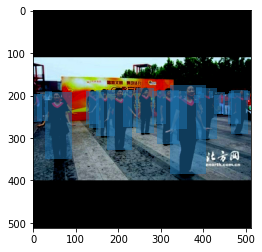

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


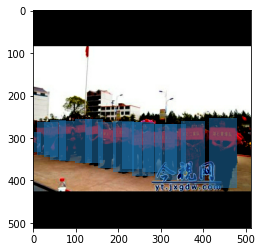

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


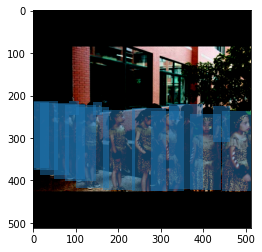

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


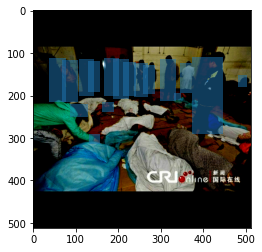

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


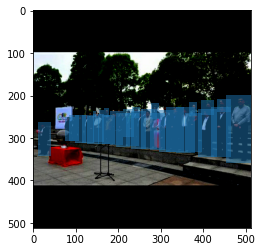

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


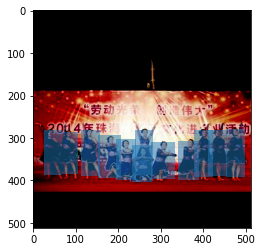

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


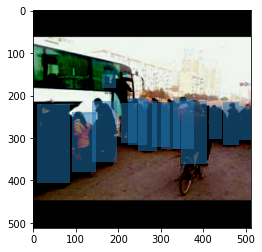

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


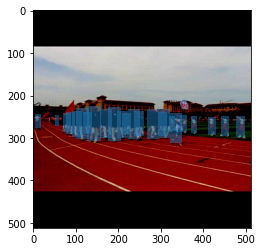

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


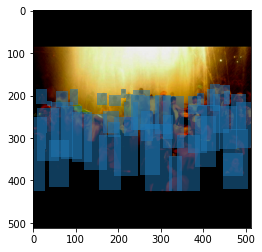

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


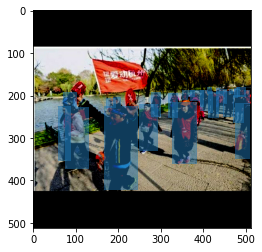

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


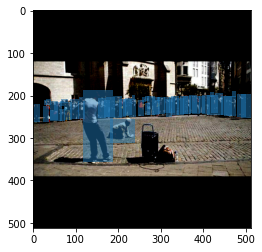

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


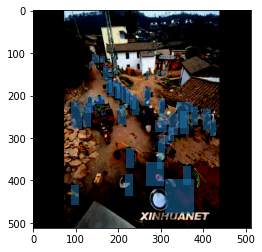

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


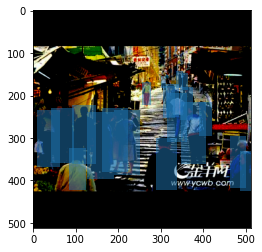

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


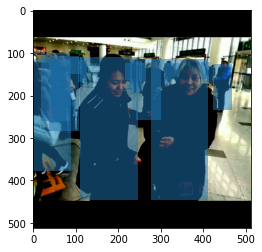

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


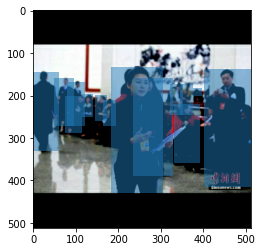

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


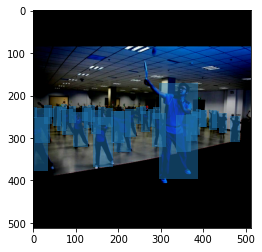

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


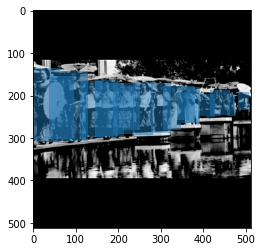

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


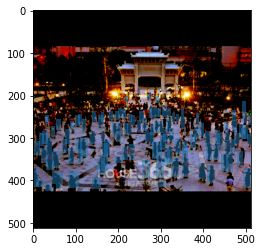

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


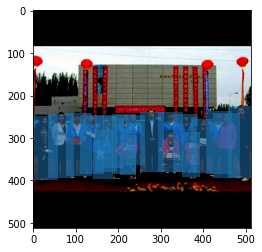

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


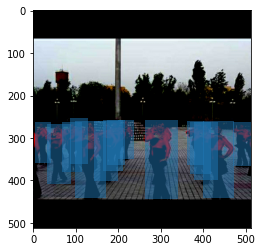

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


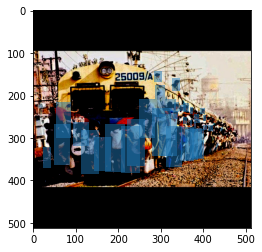

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


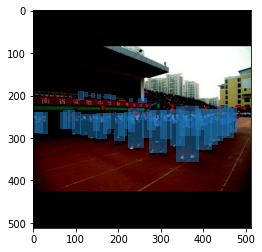

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


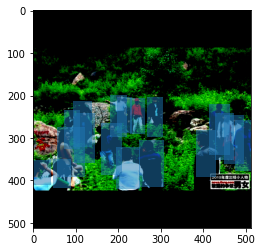

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


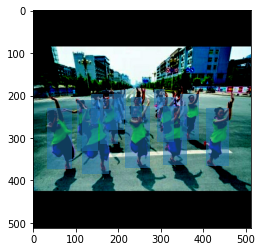

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


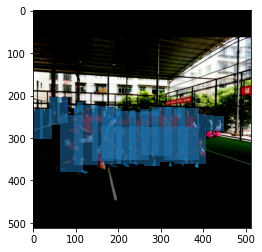

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


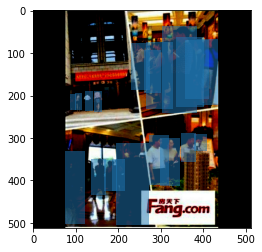

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


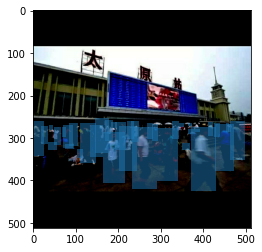

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


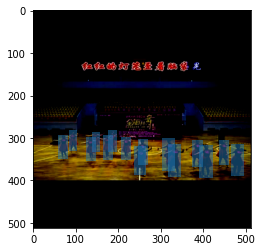

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


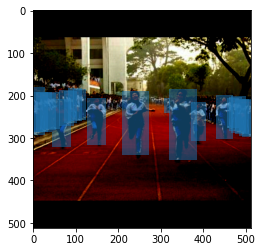

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


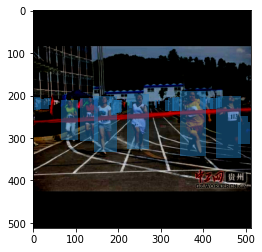

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


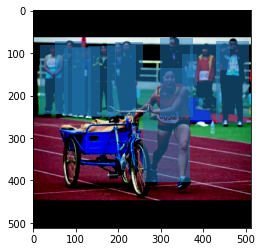

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


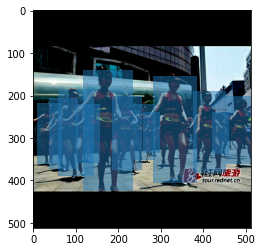

<Figure size 432x288 with 0 Axes>

In [6]:
train_set_rot = DatasetGenerator(data_dir, input_size, output_size, batch_size).get_tfdataset(True, 660, [])
for images_batch, bboxes_batch in train_set_rot.take(1):
    for image, bboxes in zip(images_batch, bboxes_batch):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]
        draw_bbox(image, valid_bboxes)

## random resized image & bounding box

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


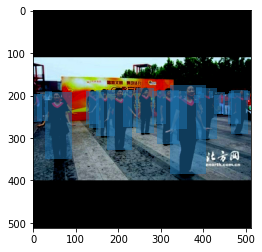

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


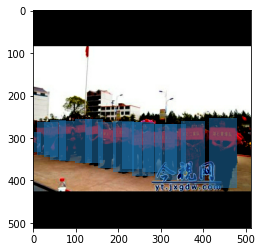

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


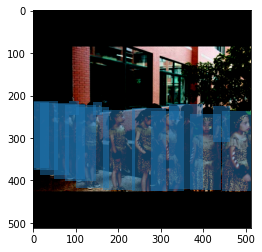

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


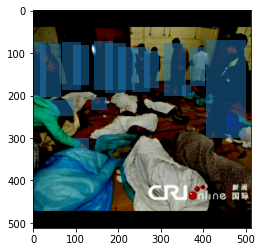

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


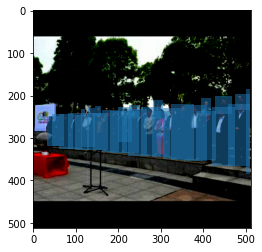

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


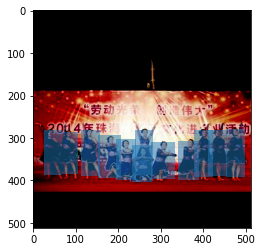

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


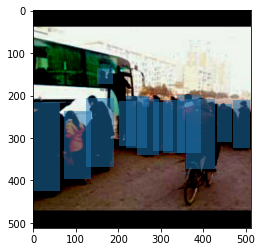

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


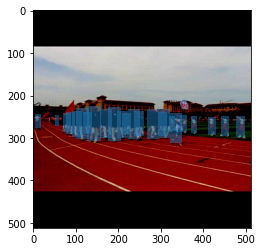

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


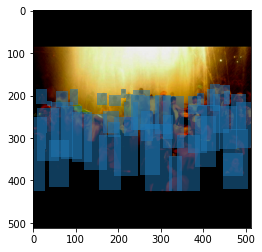

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


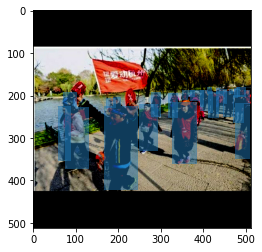

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


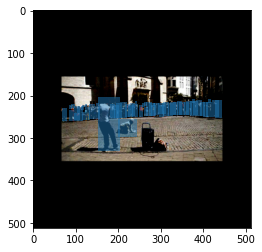

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


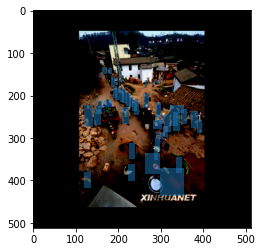

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


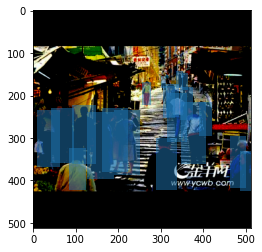

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


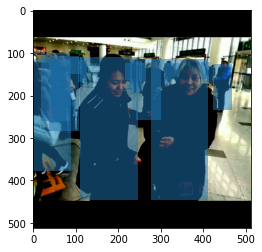

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


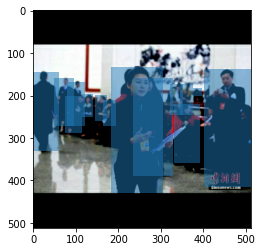

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


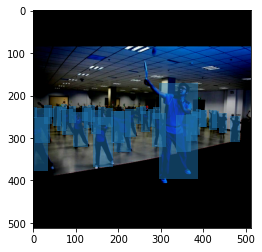

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


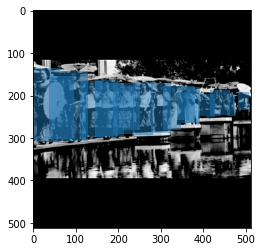

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


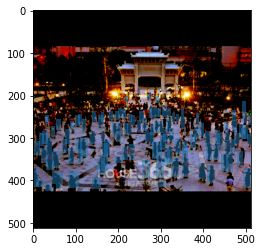

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


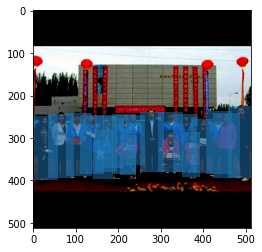

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


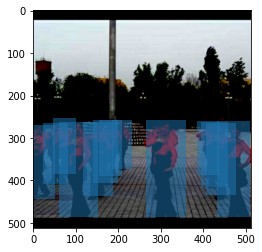

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


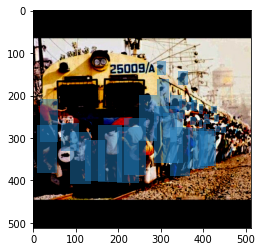

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


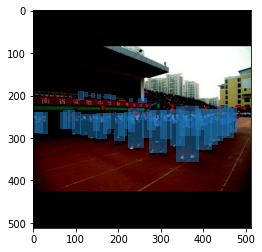

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


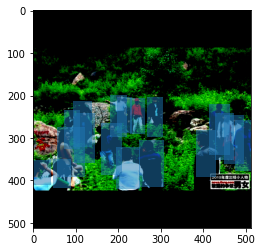

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


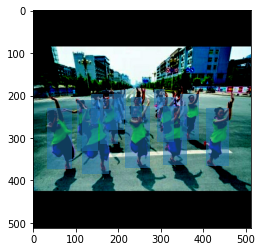

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


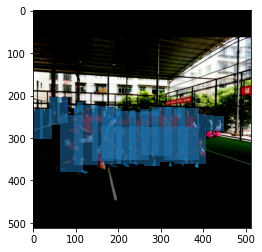

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


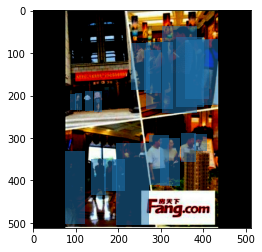

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


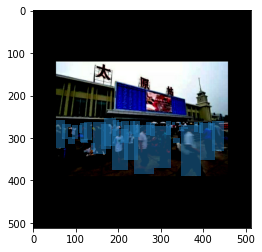

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


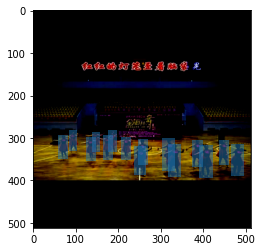

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


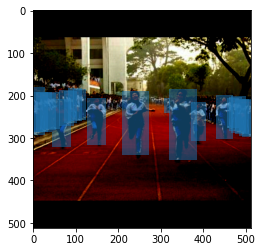

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


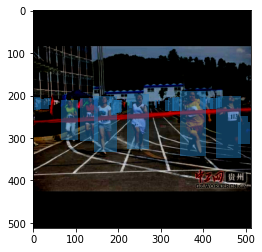

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


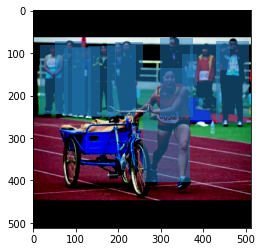

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


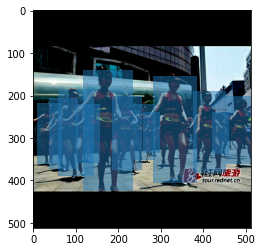

<Figure size 432x288 with 0 Axes>

In [7]:
train_set_rot = DatasetGenerator(data_dir, input_size, output_size, batch_size).get_tfdataset(True, 660, [random_resize])
for images_batch, bboxes_batch in train_set_rot.take(1):
    for image, bboxes in zip(images_batch, bboxes_batch):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]    
        draw_bbox(image, valid_bboxes)

## random flipped image & bounding box

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


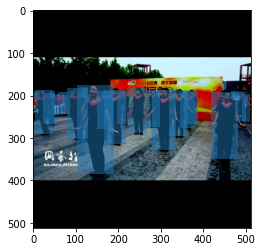

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


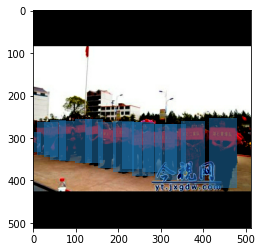

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


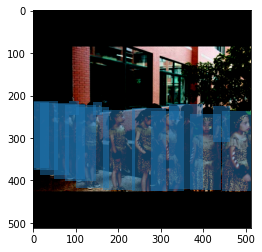

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


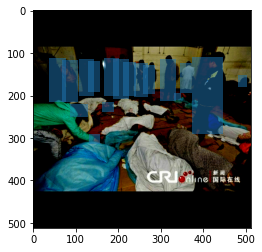

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


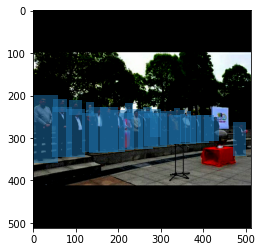

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


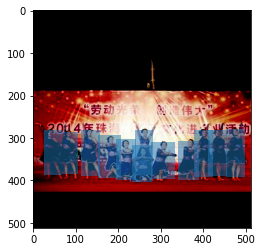

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


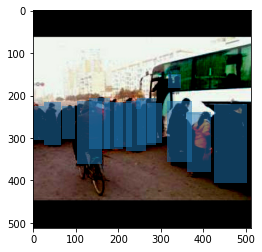

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


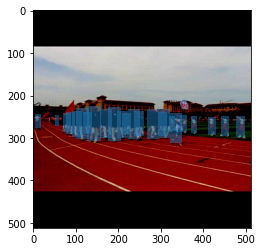

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


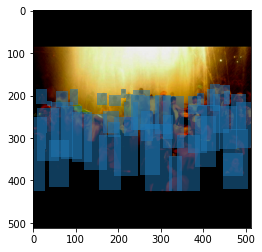

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


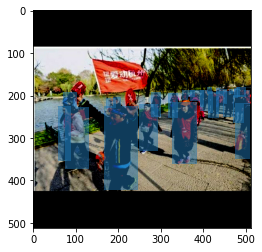

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


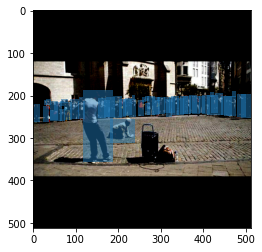

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


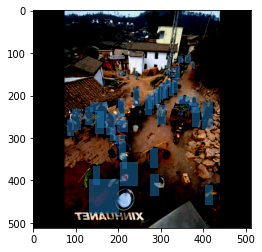

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


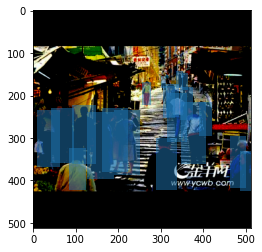

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


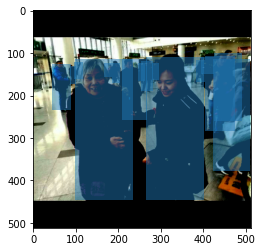

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


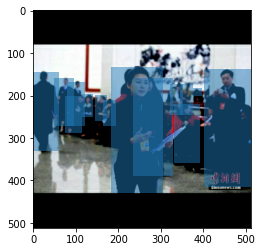

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


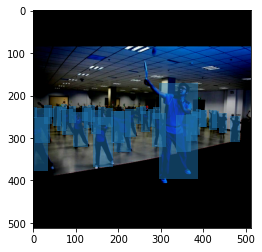

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


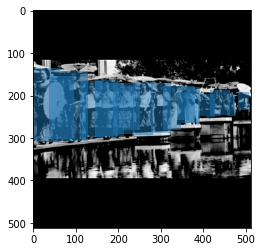

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


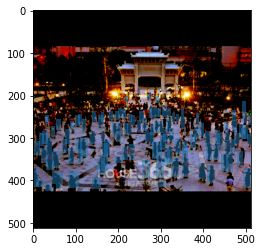

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


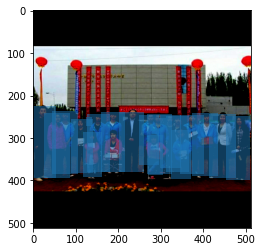

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


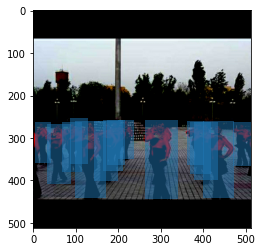

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


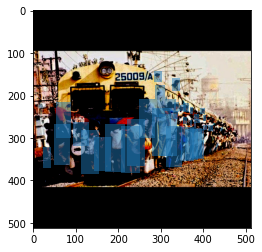

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


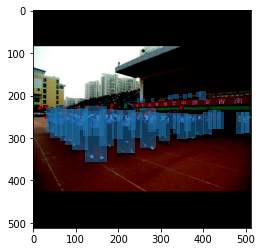

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


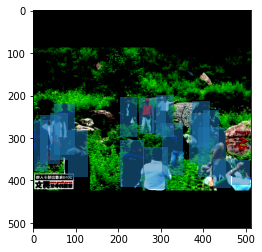

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


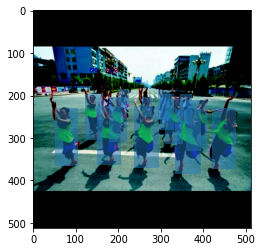

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


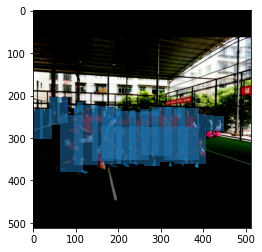

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


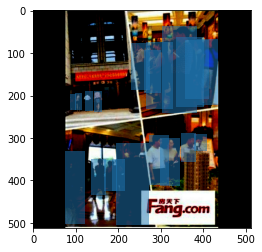

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


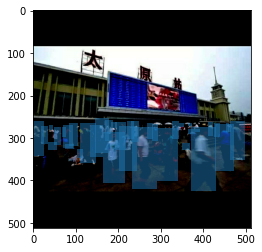

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


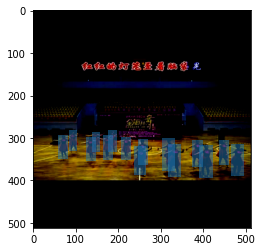

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


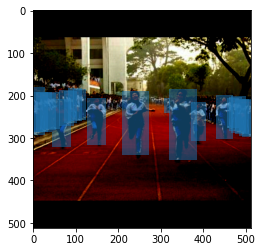

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


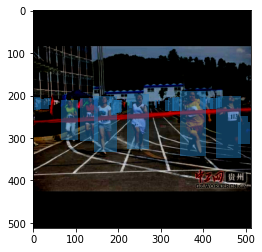

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


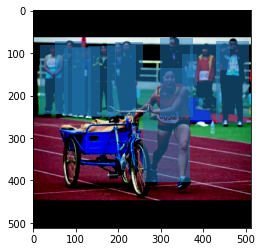

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


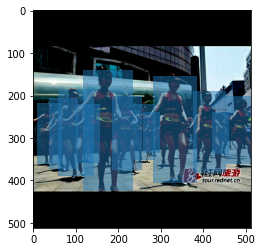

<Figure size 432x288 with 0 Axes>

In [8]:
train_set_rot = DatasetGenerator(data_dir, input_size, output_size, batch_size).get_tfdataset(True, 660, [random_flip_lr])
for images_batch, bboxes_batch in train_set_rot.take(1):
    for image, bboxes in zip(images_batch, bboxes_batch):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]
        draw_bbox(image, valid_bboxes)

## random rotated image & bounding box

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


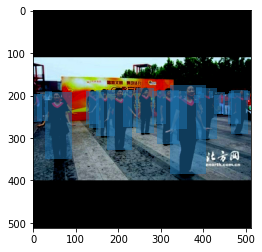

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


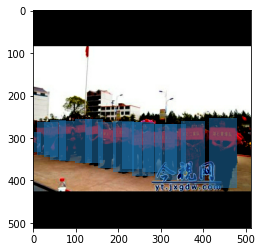

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


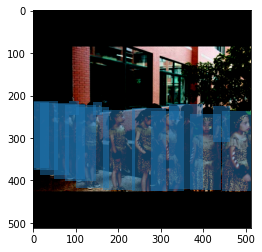

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


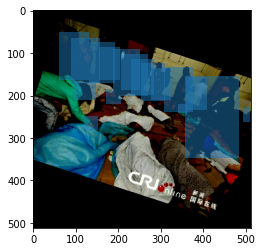

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


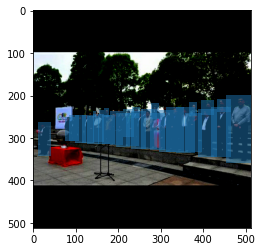

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


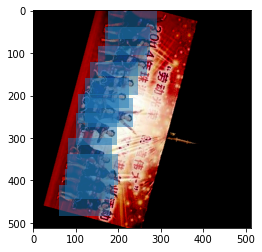

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


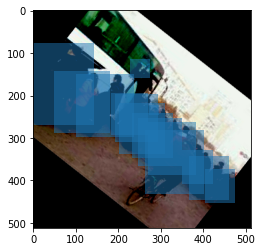

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


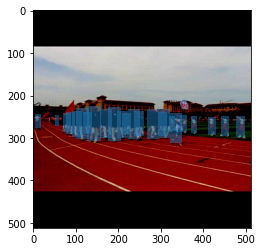

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


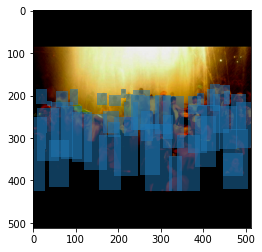

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


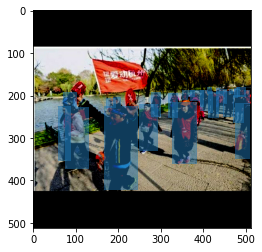

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


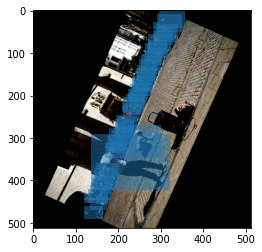

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


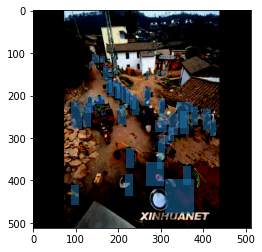

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


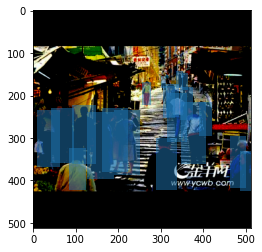

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


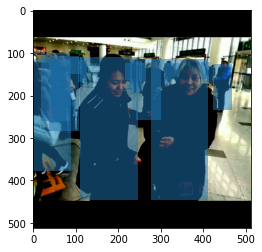

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


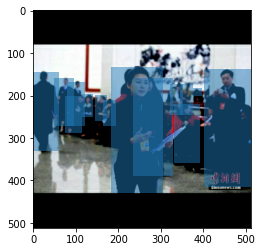

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


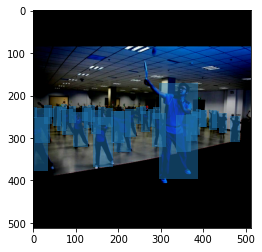

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


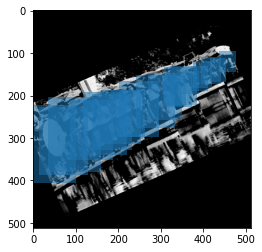

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


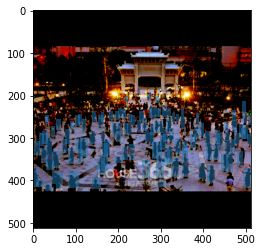

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


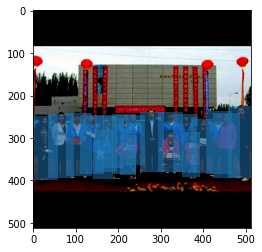

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


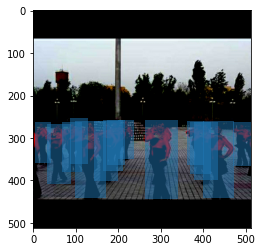

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


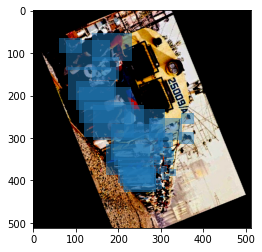

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


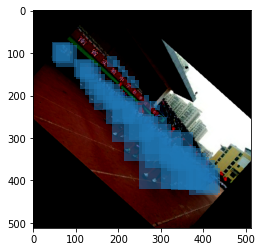

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


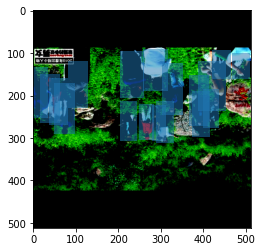

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


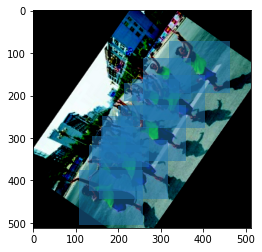

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


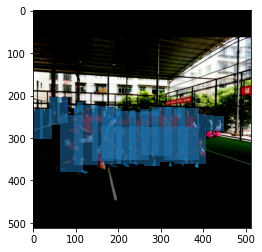

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


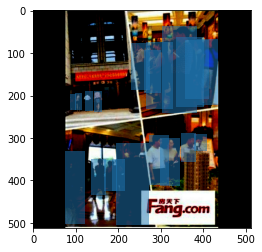

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


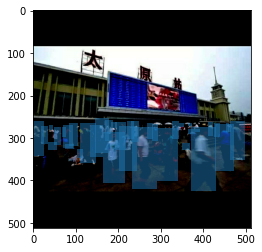

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


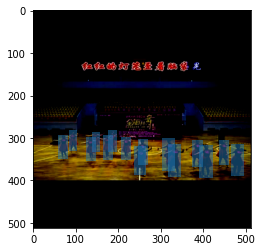

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


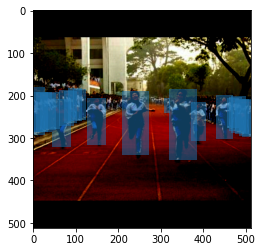

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


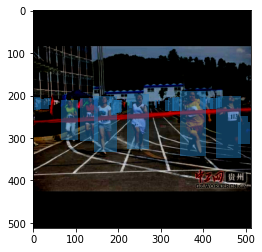

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


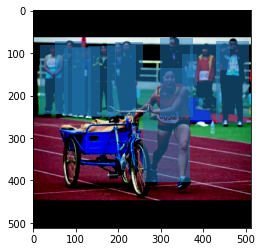

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


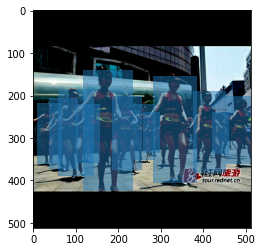

<Figure size 432x288 with 0 Axes>

In [9]:
train_set_rot = DatasetGenerator(data_dir, input_size, output_size, batch_size).get_tfdataset(True, 660, [random_rotate])
for images_batch, bboxes_batch in train_set_rot.take(1):
    for image, bboxes in zip(images_batch, bboxes_batch):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]
        draw_bbox(image, valid_bboxes)

## random translated X image & bounding box

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


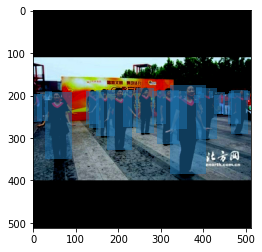

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


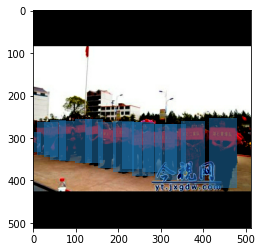

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


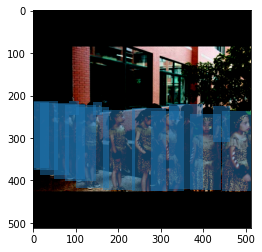

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


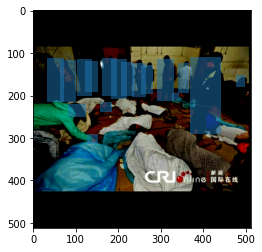

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


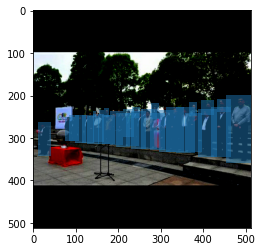

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


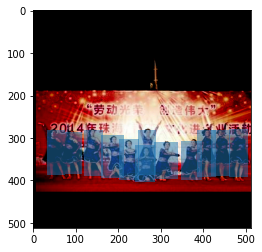

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


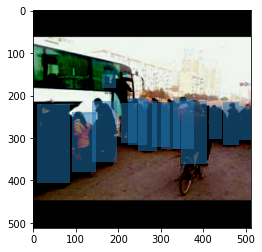

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


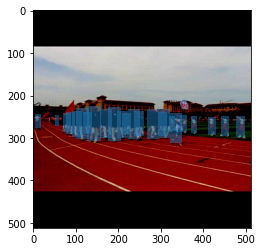

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


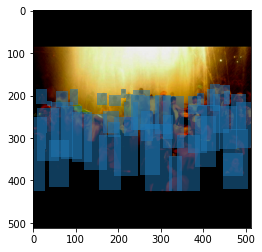

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


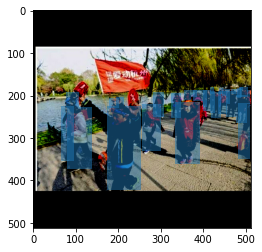

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


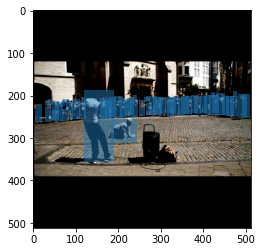

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


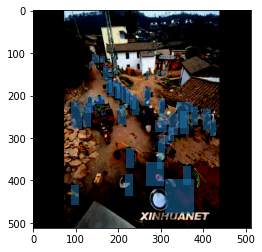

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


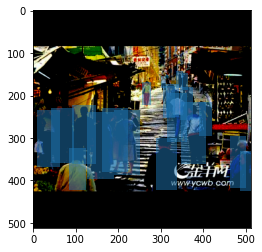

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


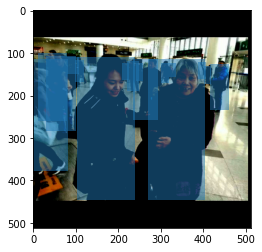

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


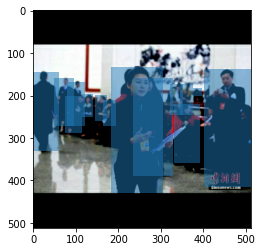

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


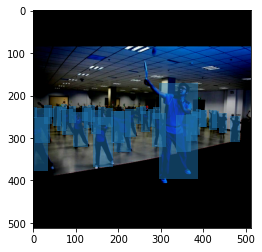

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


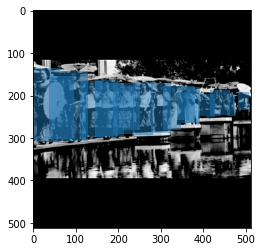

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


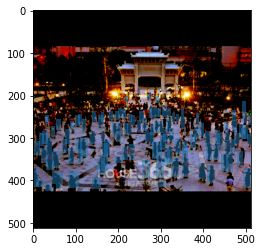

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


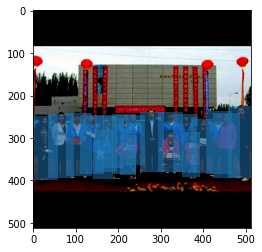

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


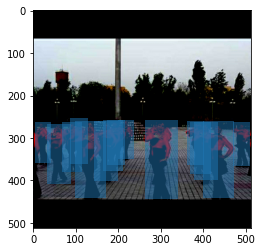

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


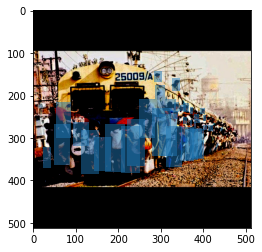

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


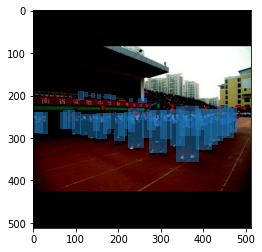

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


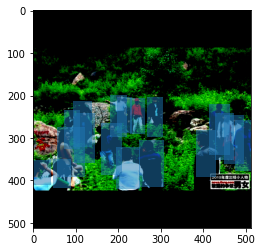

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


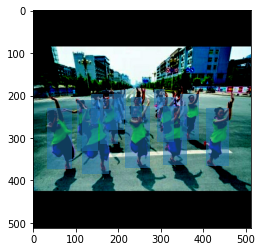

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


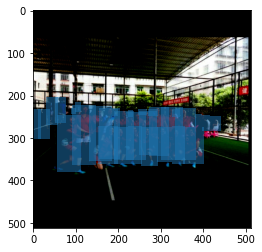

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


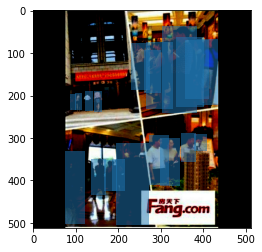

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


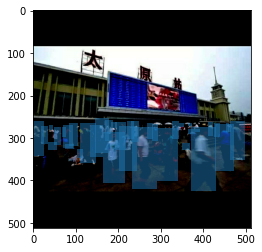

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


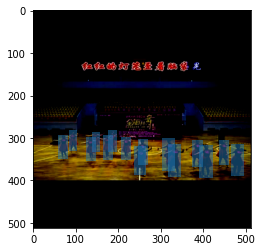

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


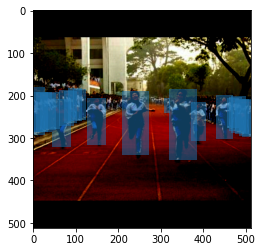

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


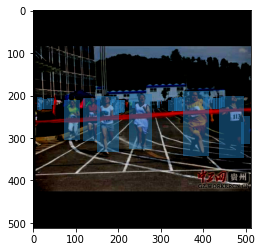

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


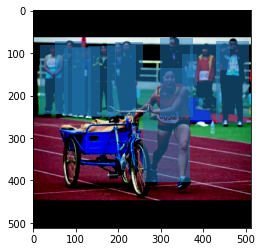

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


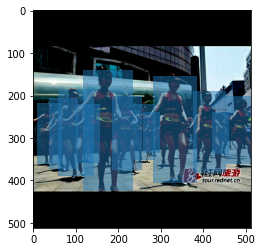

<Figure size 432x288 with 0 Axes>

In [10]:
train_set_rot = DatasetGenerator(data_dir, input_size, output_size, batch_size).get_tfdataset(True, 660, [random_translateX])
for images_batch, bboxes_batch in train_set_rot.take(1):
    for image, bboxes in zip(images_batch, bboxes_batch):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]
        draw_bbox(image, valid_bboxes)

## random translated Y image & bounding box

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


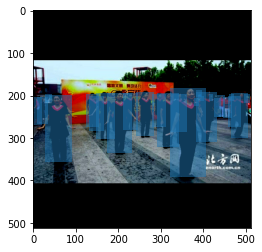

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


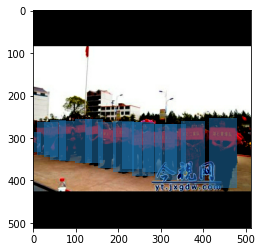

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


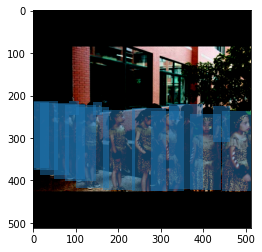

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


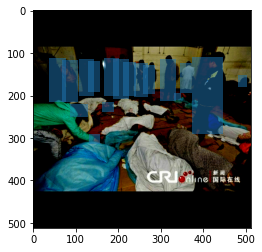

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


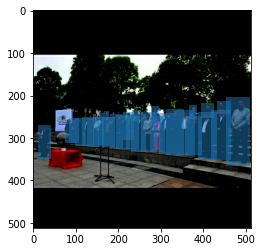

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


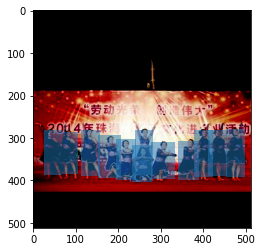

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


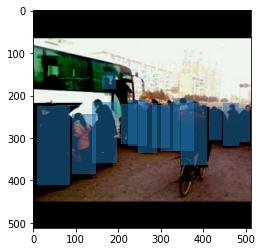

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


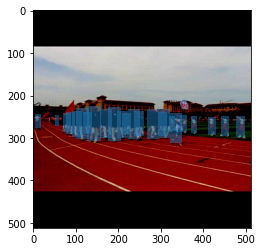

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


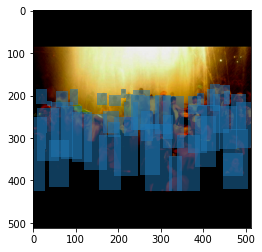

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


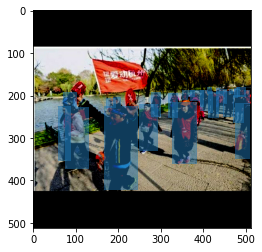

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


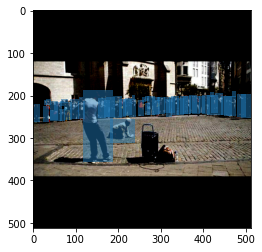

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


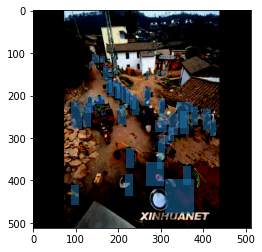

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


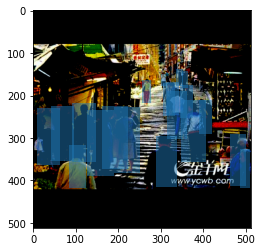

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


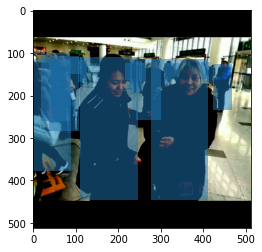

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


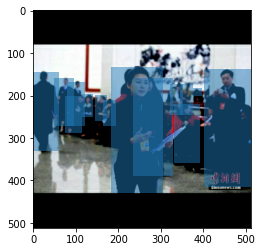

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


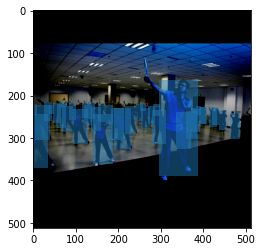

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


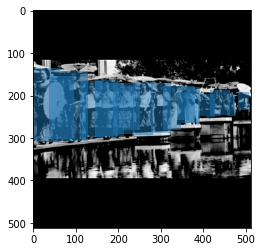

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


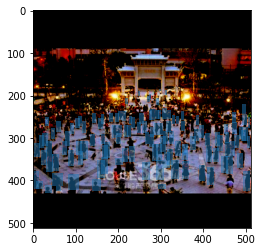

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


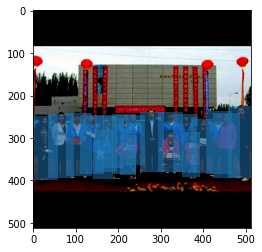

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


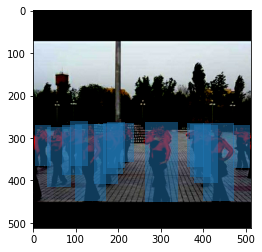

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


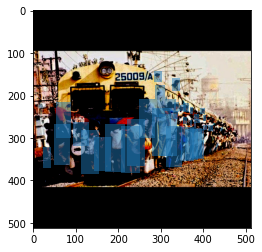

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


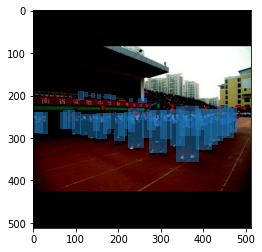

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


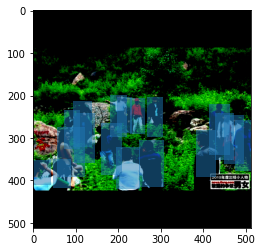

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


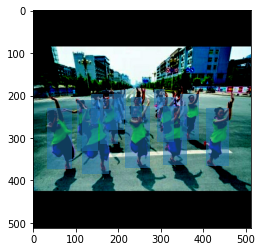

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


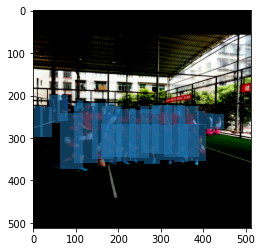

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


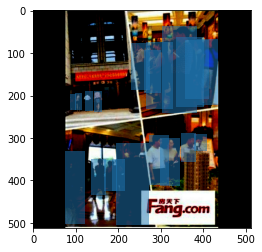

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


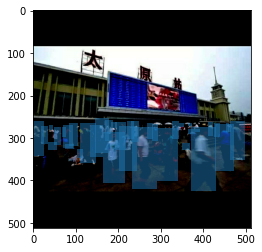

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


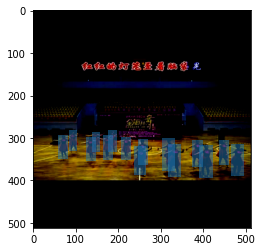

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


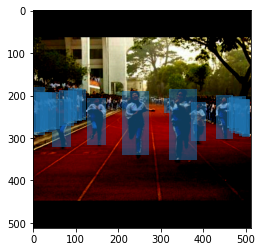

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


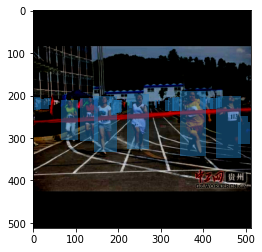

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


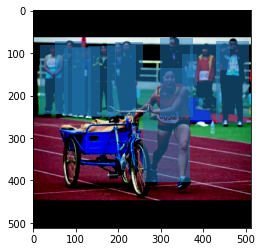

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


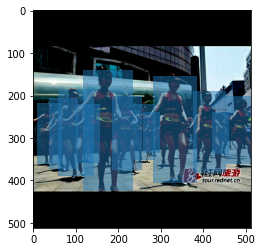

<Figure size 432x288 with 0 Axes>

In [11]:
train_set_rot = DatasetGenerator(data_dir, input_size, output_size, batch_size).get_tfdataset(True, 660, [random_translateY])
for images_batch, bboxes_batch in train_set_rot.take(1):
    for image, bboxes in zip(images_batch, bboxes_batch):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]
        draw_bbox(image, valid_bboxes)

## random sheared X image & bounding box

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


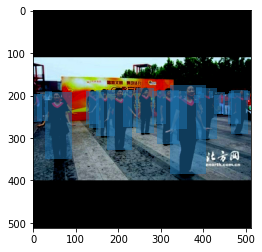

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


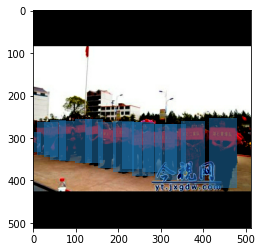

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


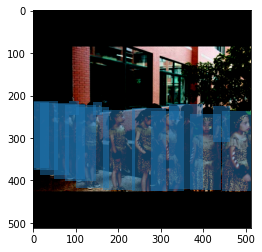

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


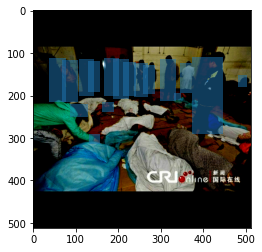

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


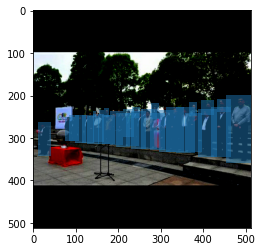

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


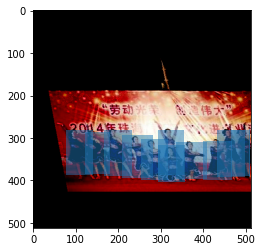

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


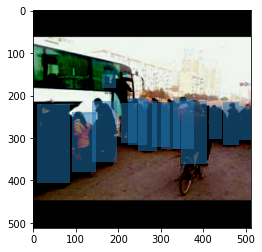

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


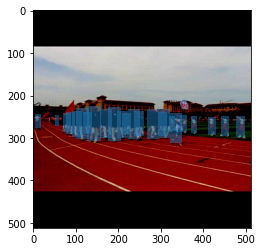

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


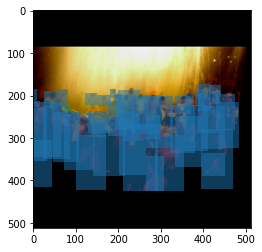

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


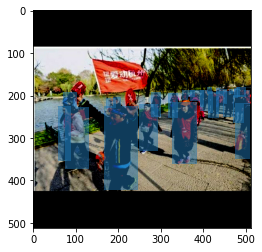

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


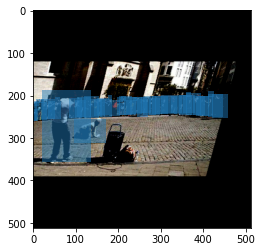

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


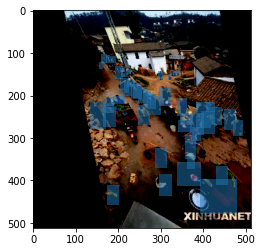

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


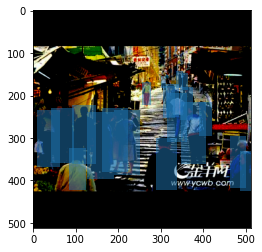

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


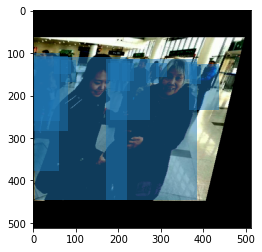

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


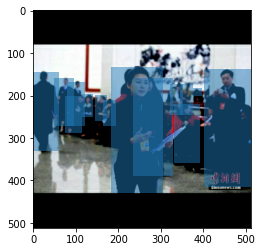

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


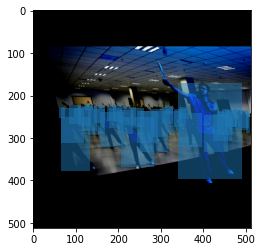

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


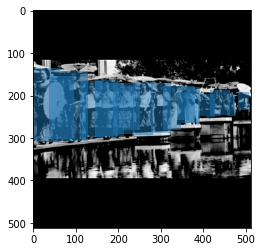

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


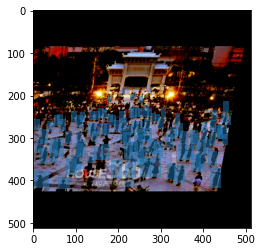

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


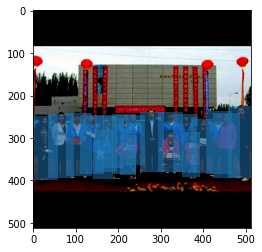

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


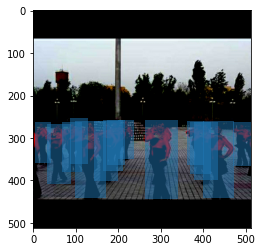

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


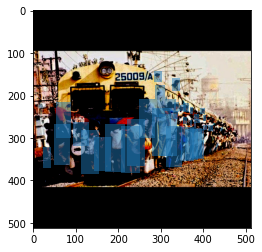

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


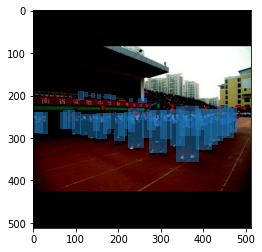

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


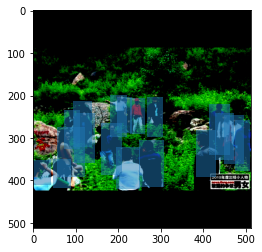

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


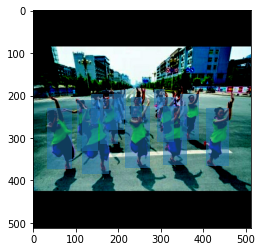

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


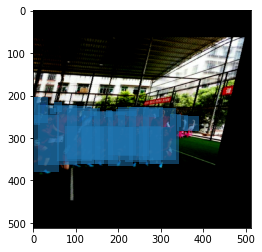

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


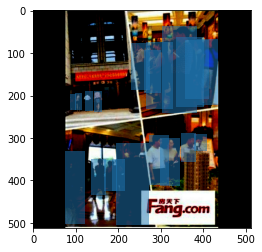

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


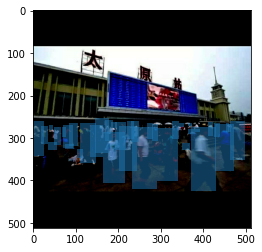

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


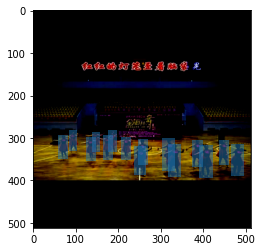

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


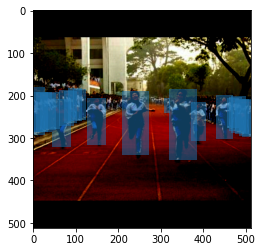

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


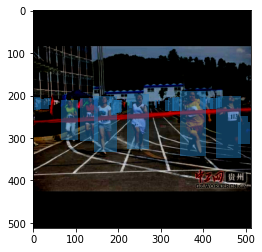

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


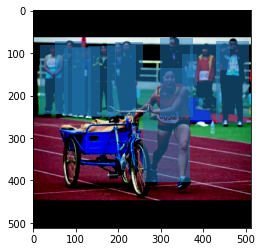

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


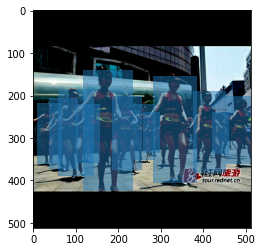

<Figure size 432x288 with 0 Axes>

In [12]:
train_set_rot = DatasetGenerator(data_dir, input_size, output_size, batch_size).get_tfdataset(True, 660, [random_shearX])
for images_batch, bboxes_batch in train_set_rot.take(1):
    for image, bboxes in zip(images_batch, bboxes_batch):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]
        draw_bbox(image, valid_bboxes)

## random sheared Y image & bounding box

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


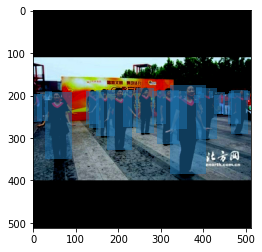

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


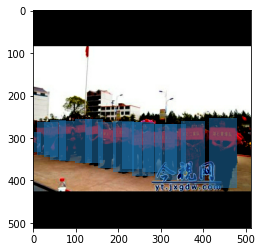

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


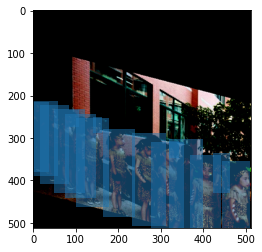

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


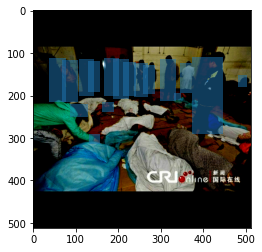

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


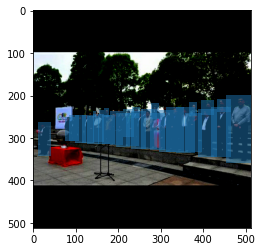

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


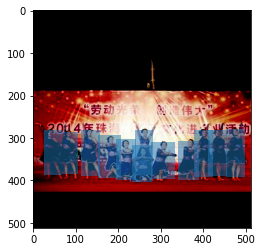

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


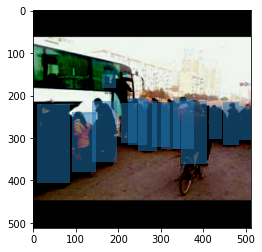

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


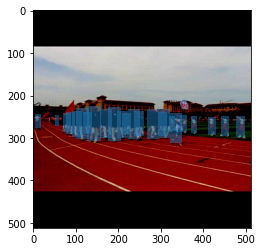

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


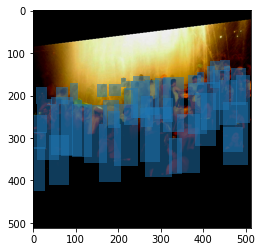

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


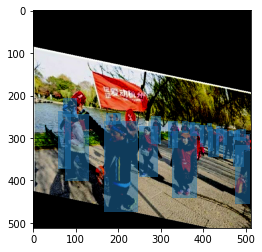

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


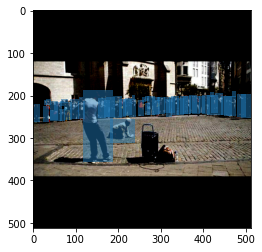

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


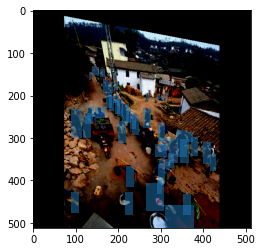

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


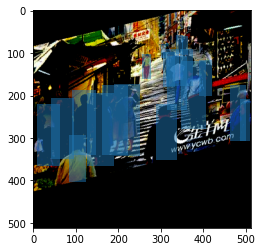

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


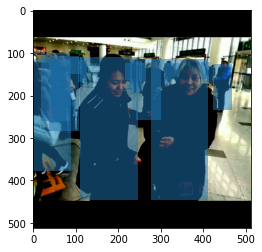

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


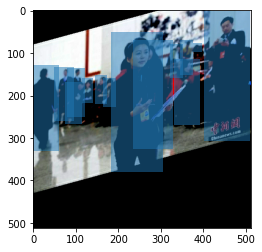

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


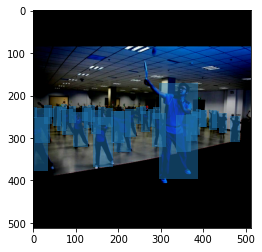

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


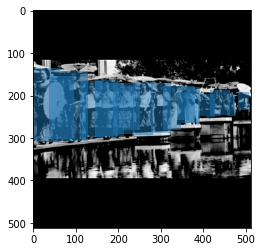

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


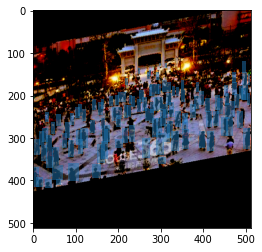

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


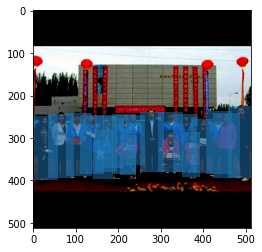

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


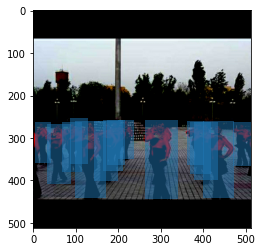

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


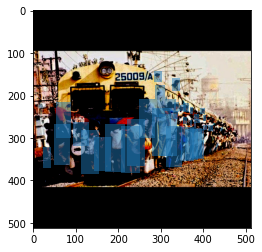

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


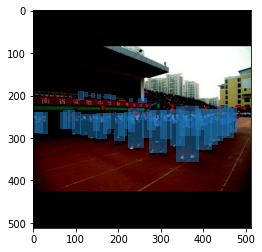

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


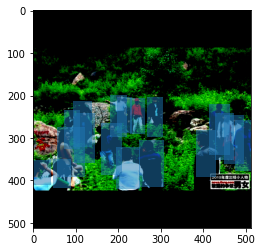

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


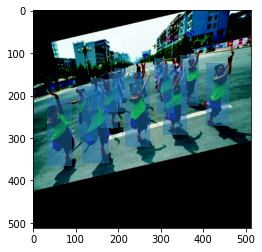

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


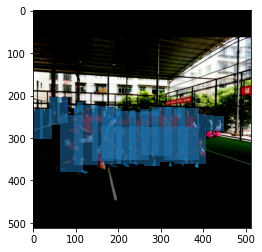

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


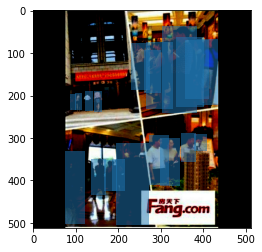

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


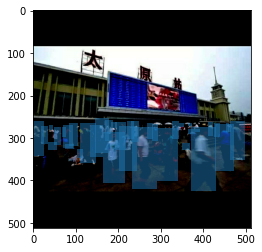

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


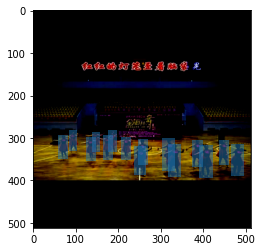

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


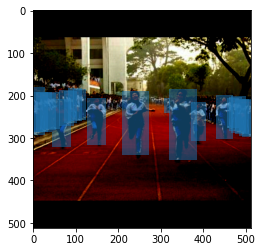

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


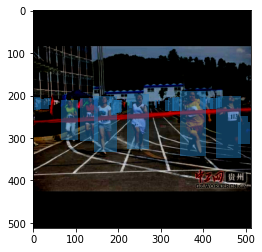

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


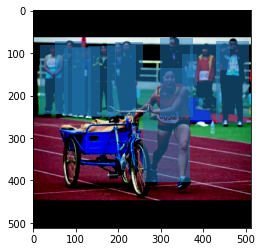

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


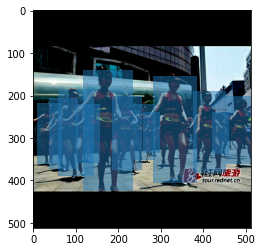

<Figure size 432x288 with 0 Axes>

In [13]:
train_set_rot = DatasetGenerator(data_dir, input_size, output_size, batch_size).get_tfdataset(True, 660, [random_shearY])
for images_batch, bboxes_batch in train_set_rot.take(1):
    for image, bboxes in zip(images_batch, bboxes_batch):
        valid_bboxes = bboxes[tf.reduce_any(bboxes != 0, axis=-1)]
        draw_bbox(image, valid_bboxes)